In [1]:
#basic imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
sns.set_style('white')
from sklearn.metrics import classification_report,accuracy_score,f1_score

In [2]:
df = pd.read_csv('updated_pollution_dataset.csv')

In [3]:
from ydata_profiling import ProfileReport
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df.head()

,Temperature,Humidity,PM2.5,PM10,NO2,SO2,CO,Proximity_to_Industrial_Areas,Population_Density,Air Quality
0,29.8,59.1,5.2,17.9,18.9,9.2,1.72,6.3,319,Moderate
1,28.3,75.6,2.3,12.2,30.8,9.7,1.64,6.0,611,Moderate
2,23.1,74.7,26.7,33.8,24.4,12.6,1.63,5.2,619,Moderate
3,27.1,39.1,6.1,6.3,13.5,5.3,1.15,11.1,551,Good
4,26.5,70.7,6.9,16.0,21.9,5.6,1.01,12.7,303,Good


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Temperature                    5000 non-null   float64
 1   Humidity                       5000 non-null   float64
 2   PM2.5                          5000 non-null   float64
 3   PM10                           5000 non-null   float64
 4   NO2                            5000 non-null   float64
 5   SO2                            5000 non-null   float64
 6   CO                             5000 non-null   float64
 7   Proximity_to_Industrial_Areas  5000 non-null   float64
 8   Population_Density             5000 non-null   int64  
 9   Air Quality                    5000 non-null   object 
dtypes: float64(8), int64(1), object(1)
memory usage: 390.8+ KB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Temperature,5000.0,30.029020,6.720661,13.40,25.10,29.00,34.000,58.60
Humidity,5000.0,70.056120,15.863577,36.00,58.30,69.80,80.300,128.10
PM2.5,5000.0,20.142140,24.554546,0.00,4.60,12.00,26.100,295.00
PM10,5000.0,30.218360,27.349199,-0.20,12.30,21.70,38.100,315.80
NO2,5000.0,26.412100,8.895356,7.40,20.10,25.30,31.900,64.90
SO2,5000.0,10.014820,6.750303,-6.20,5.10,8.00,13.725,44.90
CO,5000.0,1.500354,0.546027,0.65,1.03,1.41,1.840,3.72
Proximity_to_Industrial_Areas,5000.0,8.425400,3.610944,2.50,5.40,7.90,11.100,25.80
Population_Density,5000.0,497.423800,152.754084,188.00,381.00,494.00,600.000,957.00


In [7]:
df.dropna(inplace=True)
df.drop_duplicates(inplace=True)

### reduce memory usage

In [8]:
#float16 has range -65k -> 65k
for col in df.select_dtypes(include='number').columns:
    df[col] = df[col].astype('float16')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Temperature                    5000 non-null   float16
 1   Humidity                       5000 non-null   float16
 2   PM2.5                          5000 non-null   float16
 3   PM10                           5000 non-null   float16
 4   NO2                            5000 non-null   float16
 5   SO2                            5000 non-null   float16
 6   CO                             5000 non-null   float16
 7   Proximity_to_Industrial_Areas  5000 non-null   float16
 8   Population_Density             5000 non-null   float16
 9   Air Quality                    5000 non-null   object 
dtypes: float16(9), object(1)
memory usage: 127.1+ KB


In [10]:
df['Air Quality'].value_counts()

Air Quality
Good         2000
Moderate     1500
Poor         1000
Hazardous     500
Name: count, dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Temperature                    5000 non-null   float16
 1   Humidity                       5000 non-null   float16
 2   PM2.5                          5000 non-null   float16
 3   PM10                           5000 non-null   float16
 4   NO2                            5000 non-null   float16
 5   SO2                            5000 non-null   float16
 6   CO                             5000 non-null   float16
 7   Proximity_to_Industrial_Areas  5000 non-null   float16
 8   Population_Density             5000 non-null   float16
 9   Air Quality                    5000 non-null   object 
dtypes: float16(9), object(1)
memory usage: 127.1+ KB


### check correlation with target

In [12]:
#plot box
def plot_box(df):
    numerical_cols = list(df.drop('Air Quality',axis=1).columns)
    num_plots = len(numerical_cols)
    num_rows = (num_plots+1)//2
    num_cols = 2
    fig,axes = plt.subplots(figsize=(20,40),nrows=num_rows,ncols=num_cols)
    fig.set_facecolor('black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.boxplot(x='Air Quality',y=column,data=df,gap=0.15,width=0.75,linewidth=2.5,saturation=0.8,ax=ax,palette='rocket')
        ax.set_title(f"Boxplot of {column}",fontsize=14,color='white')
        ax.set_xlabel('Air Quality',fontsize=12,color='white')
        ax.set_ylabel(f'{column}',fontsize=12,color='white')
        ax.tick_params(axis='x',labelsize=12,colors='white')
        ax.tick_params(axis='y',labelsize=12,colors='white')
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

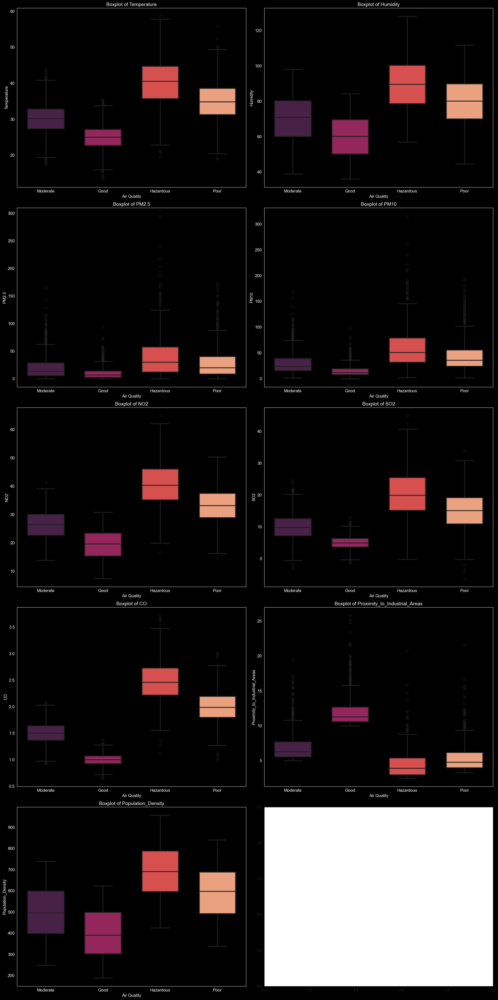

In [13]:
%matplotlib inline
plot_box(df)

In [14]:
#plot box
def plot_hist(df):
    numerical_cols = list(df.drop('Air Quality',axis=1).columns)
    num_plots = len(numerical_cols)
    num_rows = (num_plots+1)//2
    num_cols = 2
    fig,axes = plt.subplots(figsize=(20,40),nrows=num_rows,ncols=num_cols)
    fig.set_facecolor('black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.histplot(x=column,hue='Air Quality',data=df,ax=ax,palette='viridis',bins=70,kde=True)
        ax.set_title(f"Histplot of {column}",fontsize=14,color='white')
        ax.set_xlabel('Air Quality',fontsize=12,color='white')
        ax.set_ylabel(f'{column}',fontsize=12,color='white')
        ax.tick_params(axis='x',labelsize=12,colors='white')
        ax.tick_params(axis='y',labelsize=12,colors='white')
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

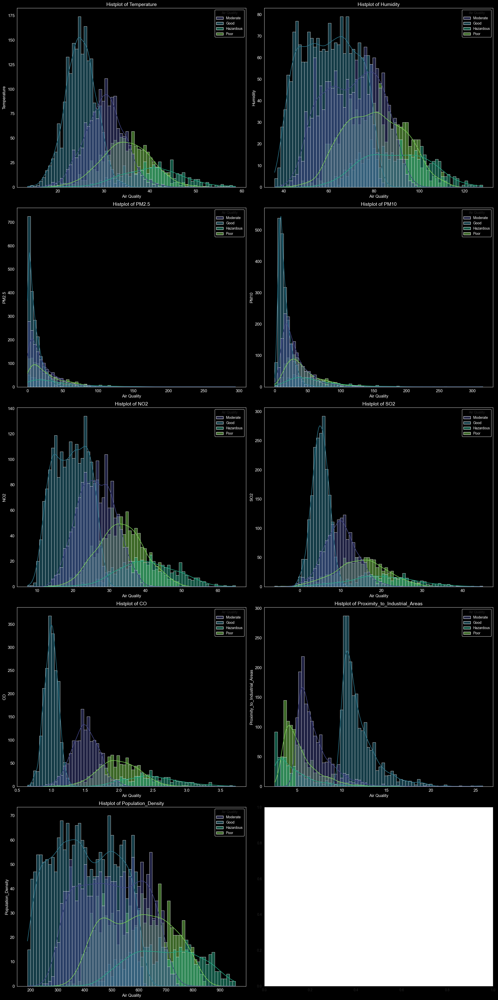

In [15]:
plot_hist(df)

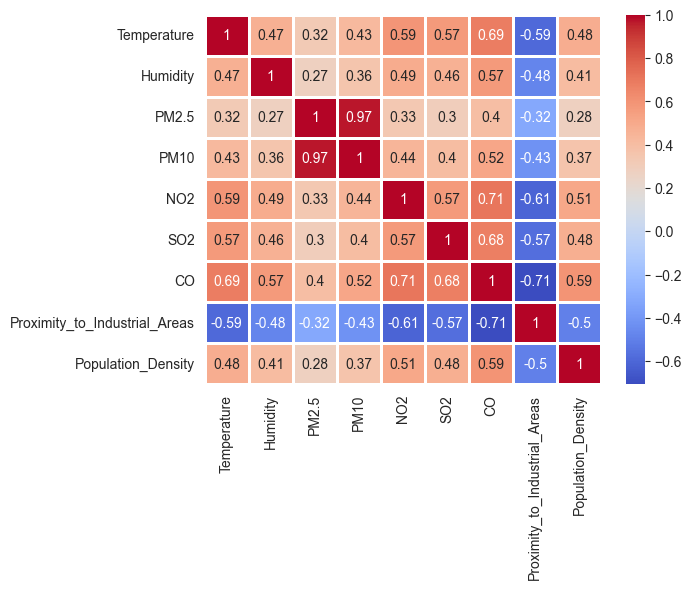

In [19]:
sns.heatmap(df.drop('Air Quality',axis=1).corr(),cmap='coolwarm',linecolor='white',linewidths=1,annot=True)
plt.show()

In [20]:
air_qual_map = {'Hazardous':3,'Poor':2,'Moderate':1,'Good':0}
df['Air Quality'] = df['Air Quality'].replace(air_qual_map)
df['Air Quality'] = df['Air Quality'].astype('int8')

In [21]:
pd.DataFrame(df.corr()['Air Quality'].drop('Air Quality')).style.background_gradient(cmap='coolwarm')

,Air Quality
Temperature,0.753566
Humidity,0.625537
PM2.5,0.418168
PM10,0.555690
NO2,0.785026
SO2,0.740202
CO,0.912535
Proximity_to_Industrial_Areas,-0.773647
Population_Density,0.645546


<Figure size 2000x2000 with 0 Axes>

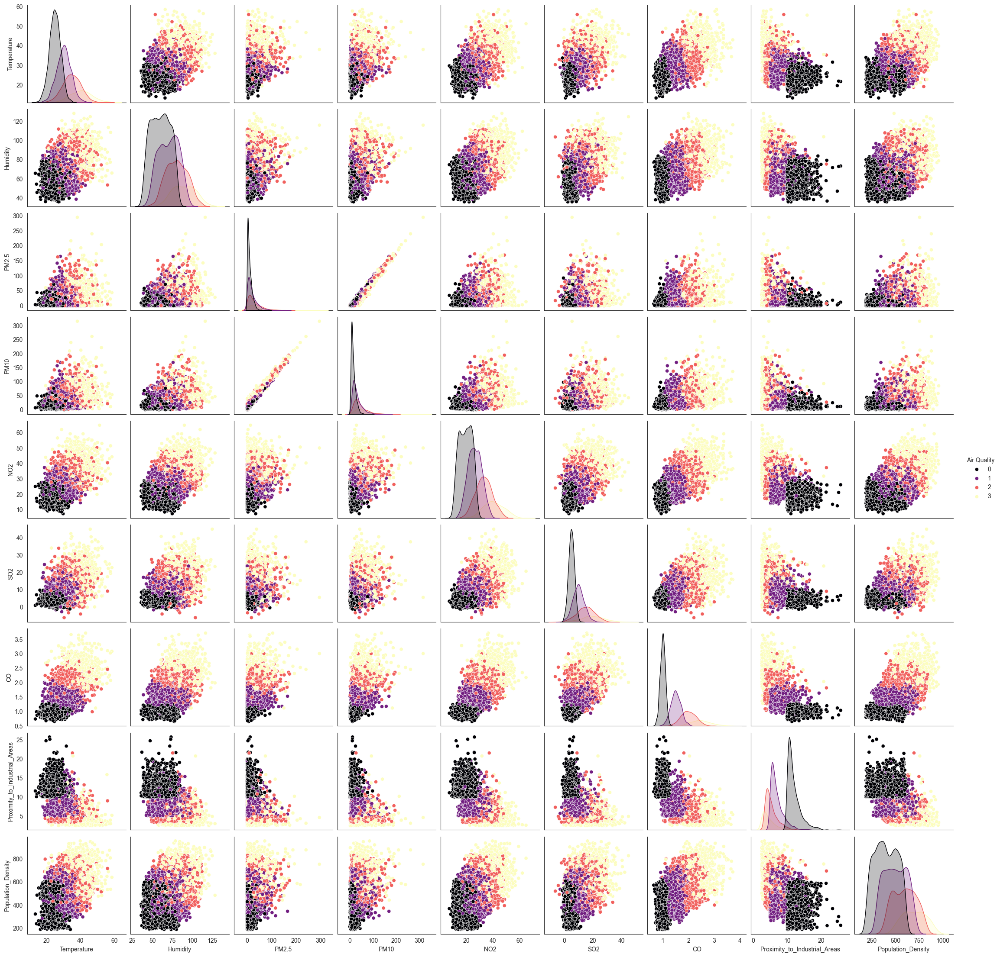

In [22]:
plt.figure(figsize=(20,20))
sns.pairplot(df,hue='Air Quality',palette='magma')
plt.show()

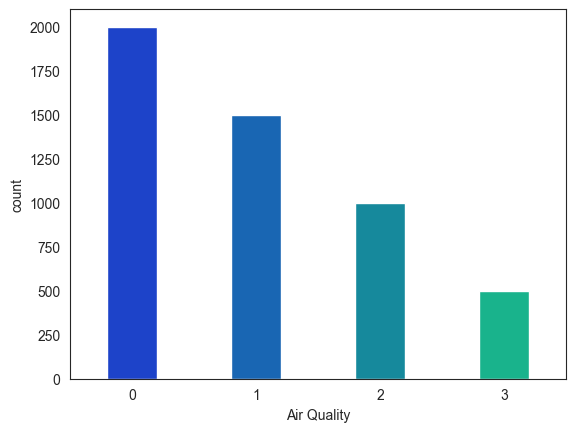

In [23]:
sns.countplot(x='Air Quality',data=df,gap=0.2,width=0.5,palette='winter')
plt.show()
#4 being worst
#imbalance exists

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 10 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Temperature                    5000 non-null   float16
 1   Humidity                       5000 non-null   float16
 2   PM2.5                          5000 non-null   float16
 3   PM10                           5000 non-null   float16
 4   NO2                            5000 non-null   float16
 5   SO2                            5000 non-null   float16
 6   CO                             5000 non-null   float16
 7   Proximity_to_Industrial_Areas  5000 non-null   float16
 8   Population_Density             5000 non-null   float16
 9   Air Quality                    5000 non-null   int8   
dtypes: float16(9), int8(1)
memory usage: 92.9 KB


### data split

In [25]:
X = df.drop('Air Quality',axis=1)
y = df['Air Quality']

In [26]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,stratify=y)

In [27]:
from sklearn.preprocessing import StandardScaler
sclr = StandardScaler()
X_train = sclr.fit_transform(X_train)
X_test = sclr.transform(X_test)

### base model

In [28]:
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
pred_dtree = dtree.predict(X_test)
print("DTREE","\n")
print(f"Accuracy : {accuracy_score(y_test,pred_dtree)}","\n")
print(f"F1 : {f1_score(y_test,pred_dtree,average='weighted')}","\n")
print("Classification Report")
print(classification_report(y_test,pred_dtree))

DTREE 

Accuracy : 0.92 

F1 : 0.9203956020471089 

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       500
           1       0.95      0.94      0.94       375
           2       0.80      0.82      0.81       250
           3       0.76      0.78      0.77       125

    accuracy                           0.92      1250
   macro avg       0.88      0.88      0.88      1250
weighted avg       0.92      0.92      0.92      1250



In [29]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print("RFC","\n")
print(f"Accuracy : {accuracy_score(y_test,pred_rfc)}","\n")
print(f"F1 : {f1_score(y_test,pred_rfc,average='weighted')}","\n")
print("Classification Report")
print(classification_report(y_test,pred_rfc))

RFC 

Accuracy : 0.956 

F1 : 0.9558073932474644 

Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.98      0.97       375
           2       0.89      0.90      0.89       250
           3       0.87      0.83      0.85       125

    accuracy                           0.96      1250
   macro avg       0.93      0.93      0.93      1250
weighted avg       0.96      0.96      0.96      1250



### oversampling might be needed

In [30]:
from imblearn.over_sampling import RandomOverSampler,SMOTE,SVMSMOTE,ADASYN

In [31]:
from collections import Counter
counter = Counter(y_train)
print("Before",counter)
ada = ADASYN()
X_train_ada,y_train_ada = ada.fit_resample(X_train,y_train)
counter = Counter(y_train_ada)
print("After",counter)

Before Counter({0: 1500, 1: 1125, 2: 750, 3: 375})
After Counter({2: 1593, 1: 1539, 0: 1500, 3: 1481})


In [32]:
counter = Counter(y_train)
print("Before",counter)
smote = SMOTE()
X_train_smt,y_train_smt = smote.fit_resample(X_train,y_train)
counter = Counter(y_train_smt)
print("After",counter)

Before Counter({0: 1500, 1: 1125, 2: 750, 3: 375})
After Counter({1: 1500, 2: 1500, 0: 1500, 3: 1500})


In [33]:
counter = Counter(y_train)
print("Before",counter)
rnd = RandomOverSampler()
X_train_rnd,y_train_rnd = rnd.fit_resample(X_train,y_train)
counter = Counter(y_train_rnd)
print("After",counter)

Before Counter({0: 1500, 1: 1125, 2: 750, 3: 375})
After Counter({1: 1500, 2: 1500, 0: 1500, 3: 1500})


In [34]:
counter = Counter(y_train)
print("Before",counter)
svm = SVMSMOTE()
X_train_svm,y_train_svm = svm.fit_resample(X_train,y_train)
counter = Counter(y_train_svm)
print("After",counter)

Before Counter({0: 1500, 1: 1125, 2: 750, 3: 375})
After Counter({1: 1500, 2: 1500, 0: 1500, 3: 1500})


In [35]:
train_dict = {'Standard':(X_train,y_train),
             'ADASYN':(X_train_ada,y_train_ada),
             'SMOTE':(X_train_smt,y_train_smt),
             'RandomSampler':(X_train_rnd,y_train_rnd),
             'SVM':(X_train_svm,y_train_svm)}

In [36]:
def iterate_train(model,model_name,train_dict=train_dict,X_test=X_test,y_test=y_test):
    print(model_name)
    accs = []
    f1s = []
    names = []
    for name,(X_train,y_train) in train_dict.items():
        print(f'Data : {name}')
        model.fit(X_train,y_train)
        pred = model.predict(X_test)
        print(f"Accuracy : {accuracy_score(y_test,pred):.4f}","\n")
        accs.append(accuracy_score(y_test,pred))
        print(f"F1 Score : {f1_score(y_test,pred,average='weighted'):.4f}","\n")
        f1s.append(f1_score(y_test,pred,average='weighted'))
        names.append(name)
        print("Classification_report")
        print(classification_report(y_test,pred),"\n")
    print(f"Average Accuracy : {np.mean(accs):.4f}")
    print(f"Average F1 : {np.mean(f1s):.4f}")
    print(f"Best Accuracy : {names[np.argmax(accs)]} : {max(accs):.4f}")
    print(f"Best F1 : {names[np.argmax(f1s)]} : {max(f1s):.4f}")

In [44]:
dtree = DecisionTreeClassifier()
met_dict = iterate_train(dtree,"DTREE")

DTREE
Data : Standard
Accuracy : 0.9208 

F1 Score : 0.9214 

Classification_report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       500
           1       0.95      0.93      0.94       375
           2       0.81      0.81      0.81       250
           3       0.77      0.82      0.79       125

    accuracy                           0.92      1250
   macro avg       0.88      0.89      0.88      1250
weighted avg       0.92      0.92      0.92      1250
 

Data : ADASYN
Accuracy : 0.9184 

F1 Score : 0.9191 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.95      0.91      0.93       375
           2       0.81      0.79      0.80       250
           3       0.76      0.90      0.82       125

    accuracy                           0.92      1250
   macro avg       0.88      0.90      0.89      1250
weighted avg       0.92

### RFC

In [45]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
iterate_train(rfc,"RFC")

RFC
Data : Standard
Accuracy : 0.9536 

F1 Score : 0.9535 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.97      0.97       375
           2       0.88      0.89      0.88       250
           3       0.87      0.84      0.85       125

    accuracy                           0.95      1250
   macro avg       0.93      0.93      0.93      1250
weighted avg       0.95      0.95      0.95      1250
 

Data : ADASYN
Accuracy : 0.9560 

F1 Score : 0.9562 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.98      0.97      0.97       375
           2       0.89      0.88      0.89       250
           3       0.85      0.90      0.87       125

    accuracy                           0.96      1250
   macro avg       0.93      0.94      0.93      1250
weighted avg       0.96  

### Logistic

In [46]:
from sklearn.linear_model import LogisticRegressionCV
lg_model = LogisticRegressionCV()
iterate_train(lg_model,"LogisticRegression")

LogisticRegression
Data : Standard
Accuracy : 0.9440 

F1 Score : 0.9439 

Classification_report
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       500
           1       0.97      0.95      0.96       375
           2       0.85      0.89      0.87       250
           3       0.86      0.80      0.83       125

    accuracy                           0.94      1250
   macro avg       0.92      0.91      0.91      1250
weighted avg       0.94      0.94      0.94      1250
 

Data : ADASYN
Accuracy : 0.9400 

F1 Score : 0.9405 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.94      0.96       375
           2       0.86      0.85      0.85       250
           3       0.79      0.89      0.84       125

    accuracy                           0.94      1250
   macro avg       0.91      0.92      0.91      1250
weighted a

### SVM

In [48]:
from sklearn.svm import SVC
svm = SVC()
iterate_train(svm,"SVM")

SVM
Data : Standard
Accuracy : 0.9480 

F1 Score : 0.9477 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.96      0.97      0.97       375
           2       0.88      0.87      0.87       250
           3       0.86      0.82      0.84       125

    accuracy                           0.95      1250
   macro avg       0.92      0.92      0.92      1250
weighted avg       0.95      0.95      0.95      1250
 

Data : ADASYN
Accuracy : 0.9504 

F1 Score : 0.9510 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.98      0.96      0.97       375
           2       0.88      0.87      0.88       250
           3       0.80      0.89      0.84       125

    accuracy                           0.95      1250
   macro avg       0.92      0.93      0.92      1250
weighted avg       0.95  

### catboost

In [53]:
from catboost import CatBoostClassifier
cat_model = CatBoostClassifier(verbose=False)
iterate_train(cat_model,'CATBOOST')

CATBOOST
Data : Standard
Accuracy : 0.9552 

F1 Score : 0.9550 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.98      0.97       375
           2       0.89      0.90      0.89       250
           3       0.87      0.83      0.85       125

    accuracy                           0.96      1250
   macro avg       0.93      0.93      0.93      1250
weighted avg       0.95      0.96      0.96      1250
 

Data : ADASYN
Accuracy : 0.9536 

F1 Score : 0.9537 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.98      0.97      0.97       375
           2       0.90      0.87      0.88       250
           3       0.83      0.87      0.85       125

    accuracy                           0.95      1250
   macro avg       0.92      0.93      0.93      1250
weighted avg       0

### xgboost 

In [55]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
iterate_train(xgb,"XGBOOST")

XGBOOST
Data : Standard
Accuracy : 0.9568 

F1 Score : 0.9567 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.97      0.97       375
           2       0.89      0.90      0.89       250
           3       0.88      0.86      0.87       125

    accuracy                           0.96      1250
   macro avg       0.94      0.93      0.93      1250
weighted avg       0.96      0.96      0.96      1250
 

Data : ADASYN
Accuracy : 0.9520 

F1 Score : 0.9521 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.97      0.97       375
           2       0.89      0.87      0.88       250
           3       0.83      0.87      0.85       125

    accuracy                           0.95      1250
   macro avg       0.92      0.93      0.93      1250
weighted avg       0.

### LGBM

In [59]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier()
iterate_train(lgbm,"LGBM")

LGBM
Data : Standard
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2169
[LightGBM] [Info] Number of data points in the train set: 3750, number of used features: 9
[LightGBM] [Info] Start training from score -0.916291
[LightGBM] [Info] Start training from score -1.203973
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Accuracy : 0.9648 

F1 Score : 0.9646 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.98      0.97       375
           2       0.91      0.91      0.91       250
           3       0.92      0.88      0.90       125

    accuracy                           0.96      1250
   macro avg 

### Voting Classifier

In [71]:
from sklearn.ensemble import VotingClassifier
rfc = RandomForestClassifier()
cat_model = CatBoostClassifier(verbose=False)
lgbm = LGBMClassifier()
xgb = XGBClassifier()
vtg = VotingClassifier(estimators=[("rfc",rfc),('cat',cat_model),('lgbm',lgbm),('xgb',xgb)],voting="soft")

In [72]:
iterate_train(vtg,"Voting Classifier")

Voting Classifier
Data : Standard
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2169
[LightGBM] [Info] Number of data points in the train set: 3750, number of used features: 9
[LightGBM] [Info] Start training from score -0.916291
[LightGBM] [Info] Start training from score -1.203973
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Accuracy : 0.9600 

F1 Score : 0.9598 

Classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       0.97      0.98      0.97       375
           2       0.90      0.90      0.90       250
           3       0.89      0.86      0.88       125

    accuracy                           0.96      1250
